In [1]:
import tensorflow as tf

import os
import math
import numpy as np

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.utils import load_img
from tensorflow.keras.utils import array_to_img
from tensorflow.keras.utils import img_to_array
from tensorflow.keras.preprocessing import image_dataset_from_directory

In [2]:
from IPython.display import display


## Download data

In [3]:
dataset_url = "http://www.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/BSR/BSR_bsds500.tgz"
data_dir = keras.utils.get_file(origin=dataset_url, fname="BSR", untar=True)
root_dir = os.path.join(data_dir, "BSDS500/data")

In [4]:
data_dir

'/Users/raunavghosh/.keras/datasets/BSR'

## Create training and validation sets

In [5]:
crop_size = 300
upscale_factor = 3
input_size = crop_size // upscale_factor
batch_size = 8

train_ds = image_dataset_from_directory(
    root_dir,
    batch_size=batch_size,
    image_size=(crop_size, crop_size),
    validation_split=0.2,
    subset="training",
    seed=1337,
    label_mode=None,
)

valid_ds = image_dataset_from_directory(
    root_dir,
    batch_size=batch_size,
    image_size=(crop_size, crop_size),
    validation_split=0.2,
    subset="validation",
    seed=1337,
    label_mode=None,
)

Found 500 files belonging to 1 classes.
Using 400 files for training.
Metal device set to: Apple M2

systemMemory: 8.00 GB
maxCacheSize: 2.67 GB

Found 500 files belonging to 1 classes.
Using 100 files for validation.


## Rescalling images

In [6]:
def scaling(input_image):
    input_image = input_image / 255.0
    return input_image


# Scale from (0, 255) to (0, 1)
train_ds = train_ds.map(scaling)
valid_ds = valid_ds.map(scaling)

In [7]:
dataset = os.path.join(root_dir, "images")
test_path = os.path.join(dataset, "test")

test_img_paths = sorted(
    [
        os.path.join(test_path, fname)
        for fname in os.listdir(test_path)
        if fname.endswith(".jpg")
    ]
)

In [8]:
dataset = os.path.join(root_dir, "images")
test_path = os.path.join(dataset, "test")

test_img_paths = sorted(
    [
        os.path.join(test_path, fname)
        for fname in os.listdir(test_path)
        if fname.endswith(".jpg")
    ]
)

## Crop and resize images

In [9]:
# Use TF Ops to process.
def process_input(input, input_size, upscale_factor):
    # generate low res images as input for the network, bicubic interpolated
    downsampled_img = tf.image.resize(input, [input_size, input_size], method="bicubic")
    # print(input.shape)
    return tf.image.resize(downsampled_img, [input.shape[1], input.shape[2]], method="bicubic")

def process_target(input):
    # retain the high res outputs
    return input


train_ds = train_ds.map(
    lambda x: (process_input(x, input_size, upscale_factor), process_target(x))
)
train_ds = train_ds.prefetch(buffer_size=32)

valid_ds = valid_ds.map(
    lambda x: (process_input(x, input_size, upscale_factor), process_target(x))
)
valid_ds = valid_ds.prefetch(buffer_size=32)

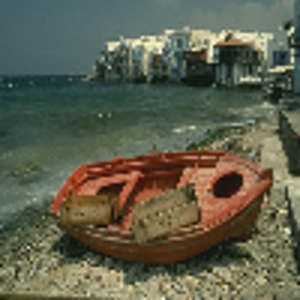

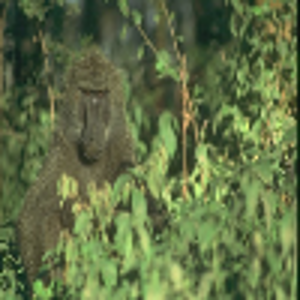

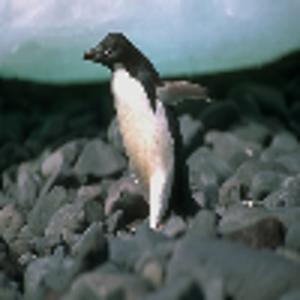

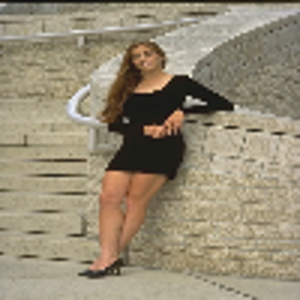

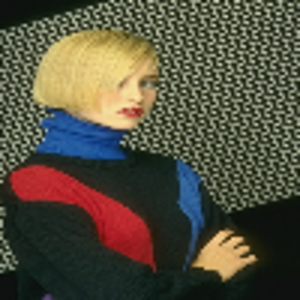

...

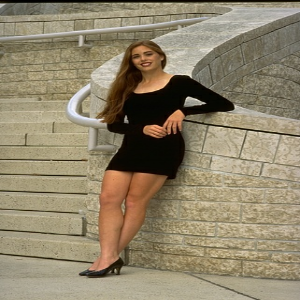

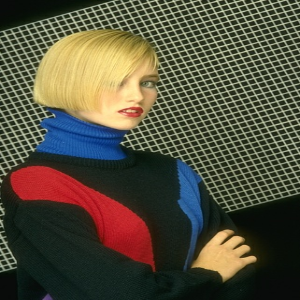

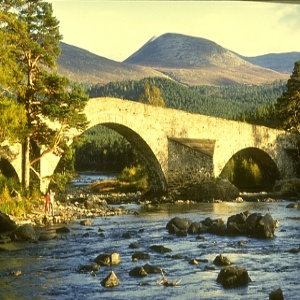

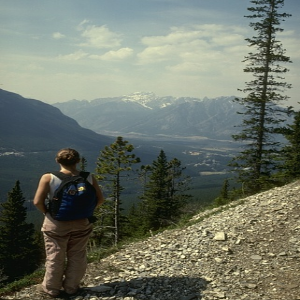

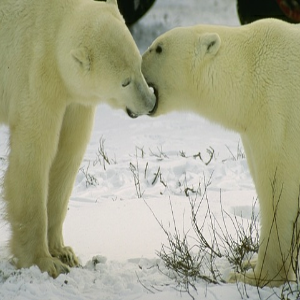

In [11]:
for batch in train_ds.take(1):
    for img in batch[0]:
        display(array_to_img(img))
        # display(array_to_img(tf.squeeze(model(tf.expand_dims(img, axis=0)))))
        # print(tf.squeeze(model(tf.expand_dims(img, axis=0))).shape)
    for img in batch[1]:
        display(array_to_img(img))
        # print(img.shape)

# Model

In [27]:
def get_model():
    # SRCNN = keras.Sequential(
    #     [
    #         layers.Input(((None, None, 3))),
    #         layers.Conv2D(filters=128, kernel_size=(9,9), activation="relu", padding="valid"),
    #         layers.Conv2D(filters=64, kernel_size=(3,3), activation="relu", padding="same"),
    #         layers.Conv2D(filters=3, kernel_size=(5,5), activation="linear", padding="valid"),
    #     ]
    # )
    input_img = layers.Input(((None, None, 3)))
    x = layers.Conv2D(filters=128, kernel_size=(9,9), activation="relu", padding="same")(input_img)
    x = layers.Conv2D(filters=64, kernel_size=(3,3), activation="relu", padding="same")(x)
    x = layers.Conv2D(filters=3, kernel_size=(5,5), activation="linear", padding="same")(x)

    SRCNN = keras.Model(inputs=[input_img], outputs=[x])

    # SRCNN.summary()
    
    # adam = keras.optimizers.Adam(learning_rate=0.0003) #different from paper
    # SRCNN.compile(optimizer=adam, loss="mean_squared_error", metrics=['mean_squared_error'])
    
    return SRCNN

In [49]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
import PIL
def plot_results(img, prefix, title):
    """Plot the result with zoom-in area."""
    img_array = img_to_array(img)
    img_array = img_array.astype("float32") / 255.0

    # Create a new figure with a default 111 subplot.
    fig, ax = plt.subplots()
    im = ax.imshow(img_array[::-1], origin="lower")

    plt.title(title)
    # zoom-factor: 2.0, location: upper-left
    axins = zoomed_inset_axes(ax, 2, loc=2)
    axins.imshow(img_array[::-1], origin="lower")

    # Specify the limits.
    x1, x2, y1, y2 = 200, 300, 100, 200
    # Apply the x-limits.
    axins.set_xlim(x1, x2)
    # Apply the y-limits.
    axins.set_ylim(y1, y2)

    plt.yticks(visible=False)
    plt.xticks(visible=False)

    # Make the line.
    mark_inset(ax, axins, loc1=1, loc2=3, fc="none", ec="blue")
    plt.savefig(str(prefix) + "-" + title + ".png")
    plt.show()

def get_lowres_image(img, upscale_factor):
    """Return low-resolution image to use as model input."""
    return img.resize(
        (img.size[0] // upscale_factor, img.size[1] // upscale_factor),
        PIL.Image.BICUBIC,
    )
def upscale_image(model, img):
    """Predict the result based on input image."""
    
    input = np.expand_dims(img, axis=0)
    input = input / 255.0
    out = model.predict(input)
    # print(input.shape)

    out_img = out[0]
    out_img *= 255.0

    return out_img

In [29]:
class SRCNNCallback(keras.callbacks.Callback):
    def __init__(self):
        super().__init__()
        self.test_img = get_lowres_image(load_img(test_img_paths[0]), upscale_factor)

    # Store PSNR value in each epoch.
    def on_epoch_begin(self, epoch, logs=None):
        self.psnr = []

    def on_epoch_end(self, epoch, logs=None):
        print("Mean PSNR for epoch: %.2f" % (np.mean(self.psnr)))
        if epoch % 20 == 0:
            prediction = upscale_image(self.model, self.test_img)
            plot_results(prediction, "epoch-" + str(epoch), "prediction")

    def on_test_batch_end(self, batch, logs=None):
        self.psnr.append(10 * math.log10(1 / logs["loss"]))

In [30]:
early_stopping_callback = keras.callbacks.EarlyStopping(monitor="loss", patience=10)

checkpoint_filepath = "/tmp/checkpoint"

model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor="loss",
    mode="min",
    save_best_only=True,
)

model = get_model()
model.summary()

callbacks = [early_stopping_callback, model_checkpoint_callback]
loss_fn = keras.losses.MeanSquaredError()
optimizer = keras.optimizers.Adam(learning_rate=0.003)

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 conv2d_6 (Conv2D)           (None, None, None, 128)   31232     
                                                                 
 conv2d_7 (Conv2D)           (None, None, None, 64)    73792     
                                                                 
 conv2d_8 (Conv2D)           (None, None, None, 3)     4803      
                                                                 
Total params: 109,827
Trainable params: 109,827
Non-trainable params: 0
_________________________________________________________________


In [31]:
epochs = 100

model.compile(
    optimizer=optimizer, loss=loss_fn,
)

model.fit(
    train_ds, epochs=epochs, callbacks=callbacks, validation_data=valid_ds, verbose=1
)

# The model weights (that are considered the best) are loaded into the model.
model.load_weights(checkpoint_filepath)

Epoch 1/100
50/50 [==============================] - 28s 506ms/step - loss: 0.1119 - val_loss: 0.0137
Epoch 2/100
50/50 [==============================] - 24s 482ms/step - loss: 0.0092 - val_loss: 0.0063
Epoch 3/100
50/50 [==============================] - 25s 489ms/step - loss: 0.0058 - val_loss: 0.0053
Epoch 4/100
50/50 [==============================] - 25s 503ms/step - loss: 0.0057 - val_loss: 0.0050
Epoch 5/100
50/50 [==============================] - 25s 505ms/step - loss: 0.0056 - val_loss: 0.0065
Epoch 6/100
50/50 [==============================] - 24s 481ms/step - loss: 0.0049 - val_loss: 0.0040
Epoch 7/100
50/50 [==============================] - 24s 476ms/step - loss: 0.0042 - val_loss: 0.0038
Epoch 8/100
50/50 [==============================] - 24s 484ms/step - loss: 0.0041 - val_loss: 0.0037
Epoch 9/100
50/50 [==============================] - 25s 492ms/step - loss: 0.0041 - val_loss: 0.0040
Epoch 10/100
50/50 [==============================] - 25s 504ms/step - loss: 0.004

In [35]:
model.save("srcnn_trained.h5")

1/1 [==============================] - 0s 48ms/step
267.81873 19.248175
PSNR of low resolution image and high resolution image is 30.0157
PSNR of predict and high resolution is 29.1380


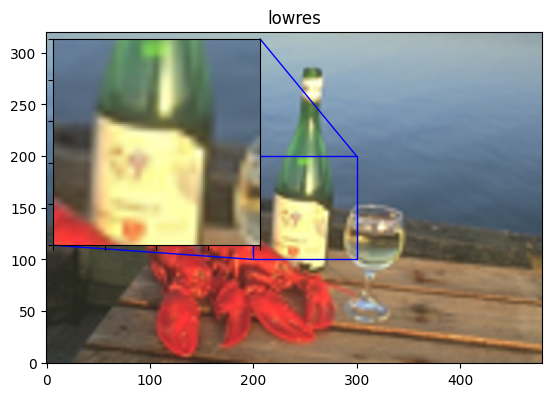

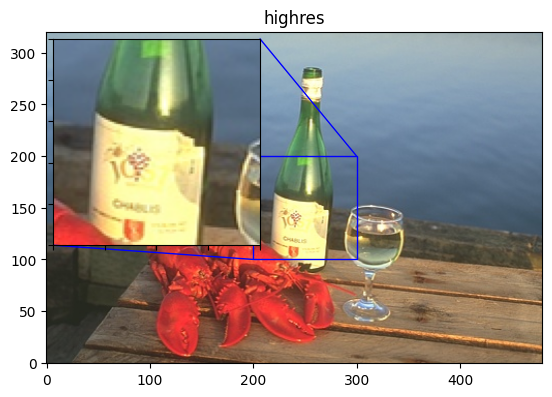

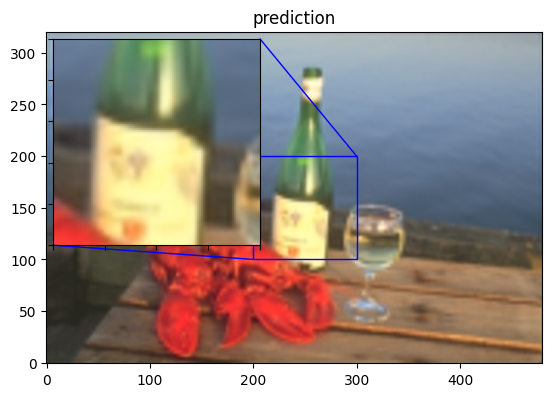

1/1 [==============================] - 0s 10ms/step
269.2838 32.317028
PSNR of low resolution image and high resolution image is 25.1103
PSNR of predict and high resolution is 24.1231


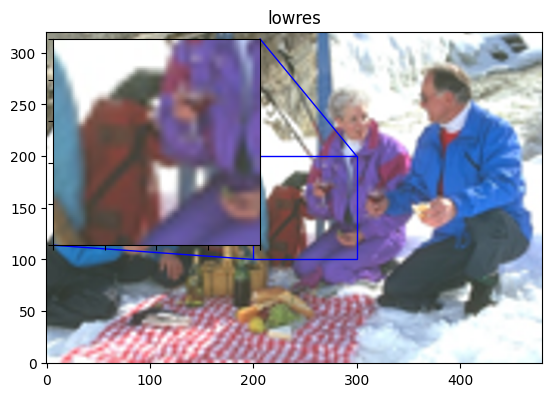

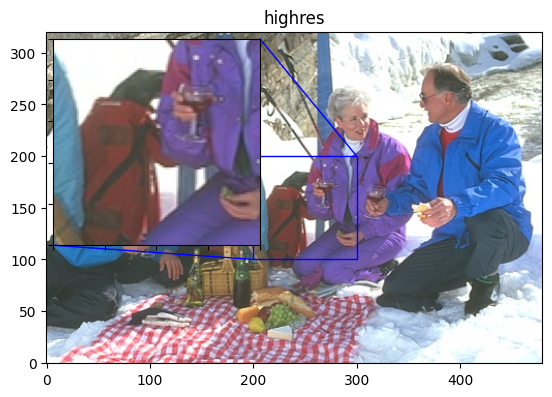

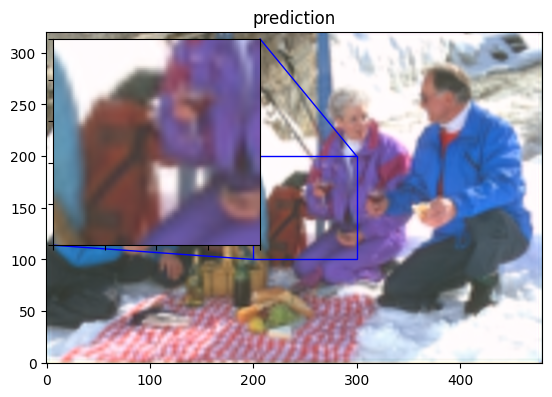

1/1 [==============================] - 0s 49ms/step
260.2289 -6.8210635
PSNR of low resolution image and high resolution image is 27.7789
PSNR of predict and high resolution is 27.0570


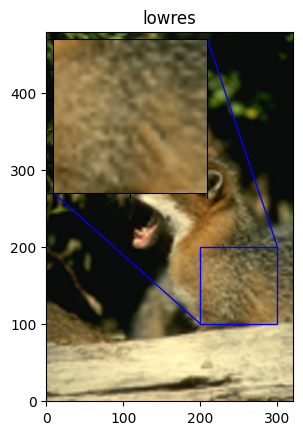

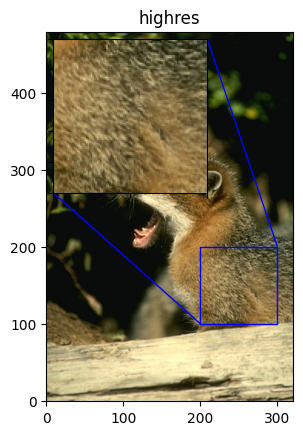

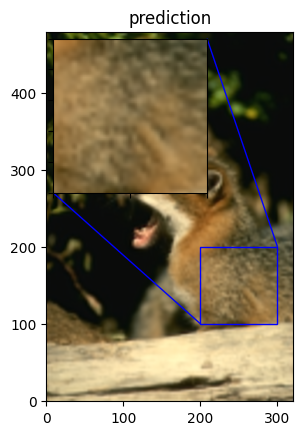

1/1 [==============================] - 0s 24ms/step
233.54088 -7.2479467
PSNR of low resolution image and high resolution image is 28.0321
PSNR of predict and high resolution is 27.7011


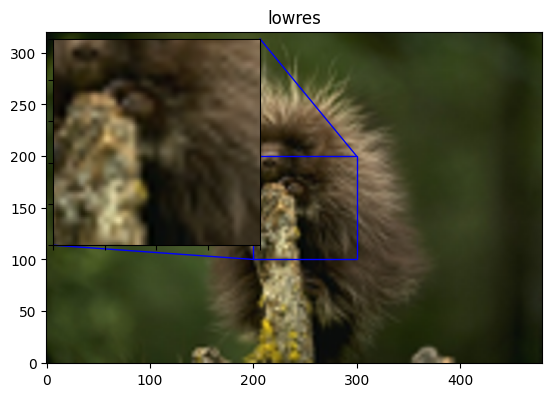

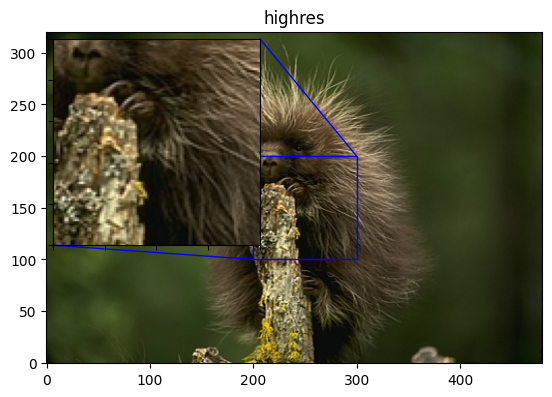

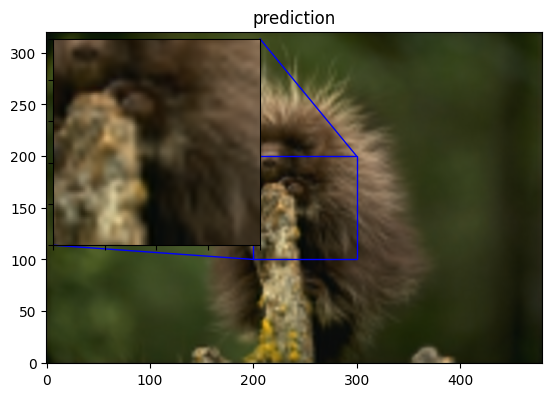

1/1 [==============================] - 0s 21ms/step
265.02036 25.948193
PSNR of low resolution image and high resolution image is 25.7853
PSNR of predict and high resolution is 25.2060


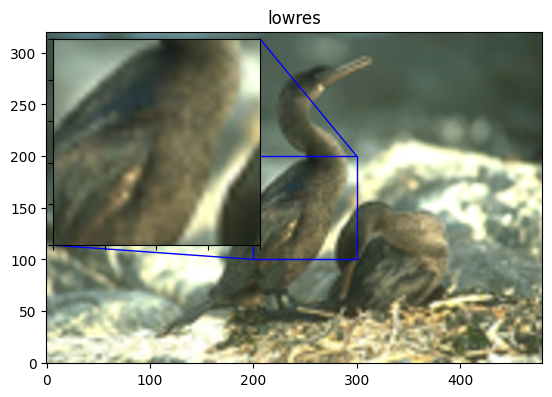

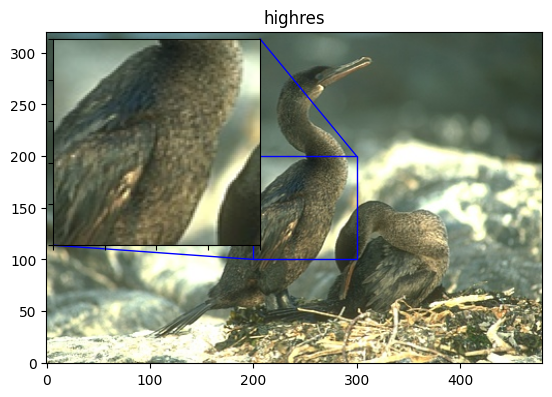

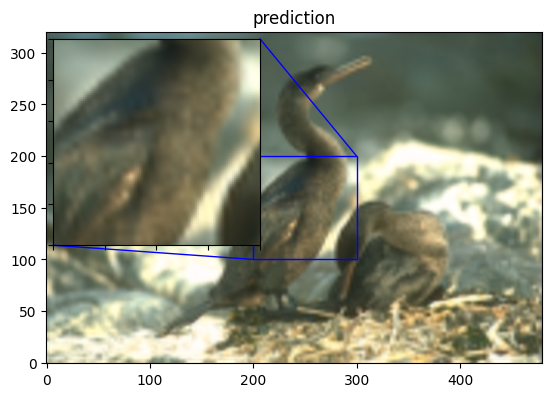

1/1 [==============================] - 0s 12ms/step
271.47583 -14.139652
PSNR of low resolution image and high resolution image is 25.9181
PSNR of predict and high resolution is 25.0913


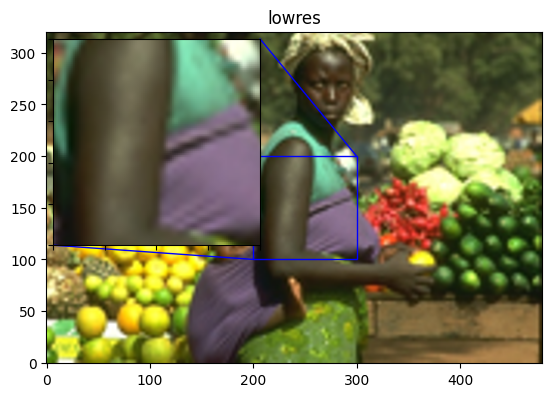

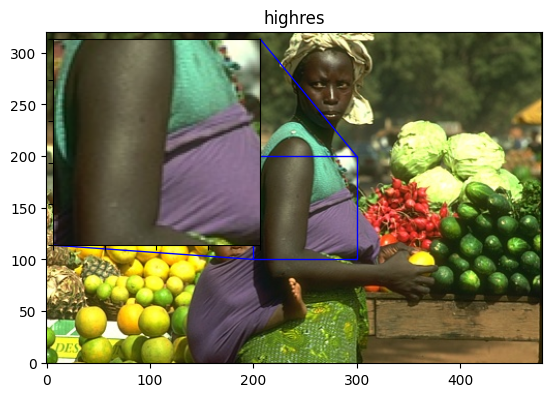

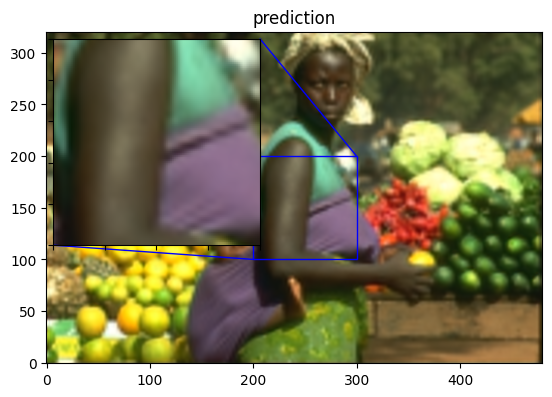

1/1 [==============================] - 0s 12ms/step
263.73096 7.587185
PSNR of low resolution image and high resolution image is 26.2389
PSNR of predict and high resolution is 25.5268


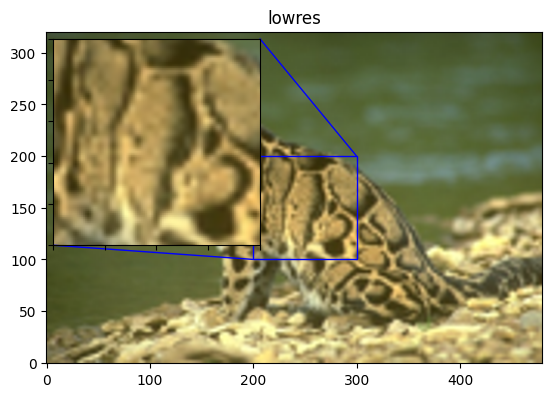

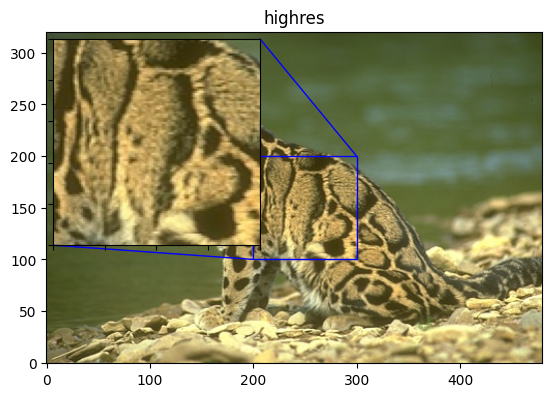

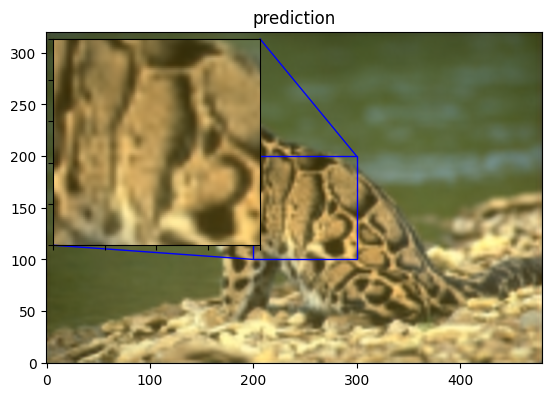

1/1 [==============================] - 0s 13ms/step
257.3047 8.026184
PSNR of low resolution image and high resolution image is 23.3281
PSNR of predict and high resolution is 22.7893


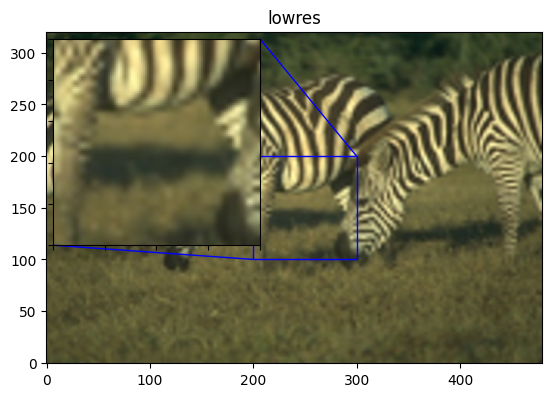

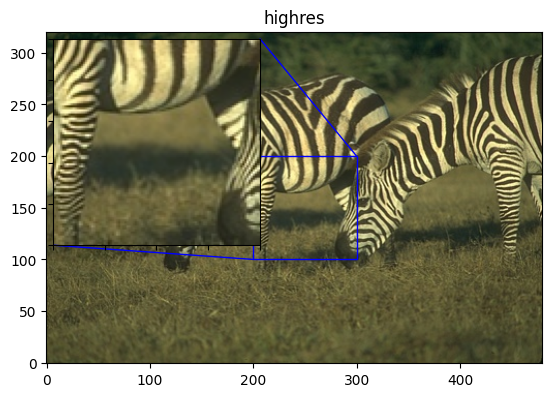

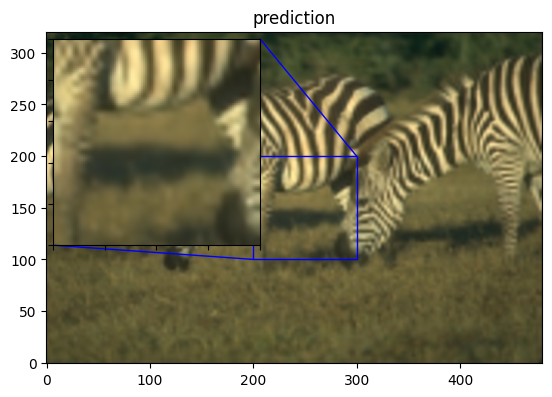

1/1 [==============================] - 0s 25ms/step
188.70079 0.58544147
PSNR of low resolution image and high resolution image is 29.9008
PSNR of predict and high resolution is 29.4357


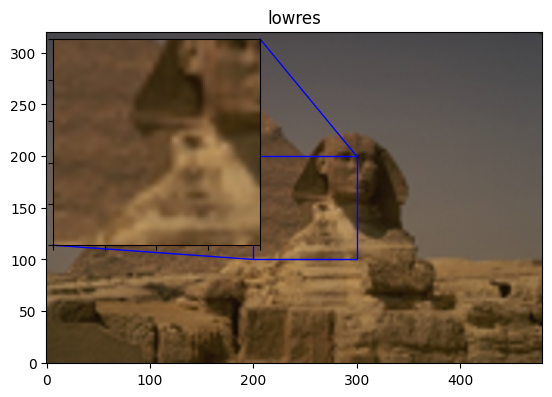

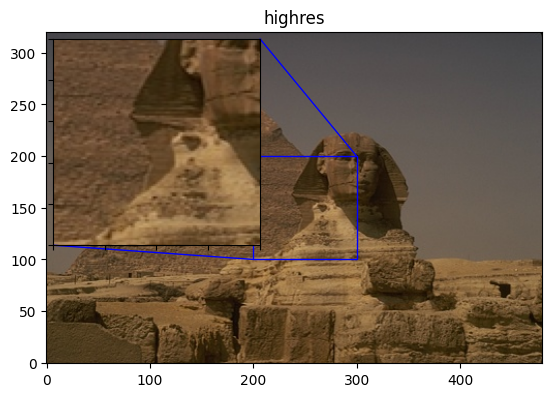

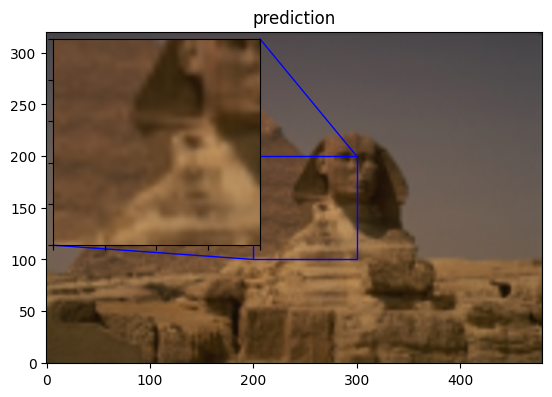

1/1 [==============================] - 0s 33ms/step
266.66876 -13.947279
PSNR of low resolution image and high resolution image is 25.2492
PSNR of predict and high resolution is 24.4887


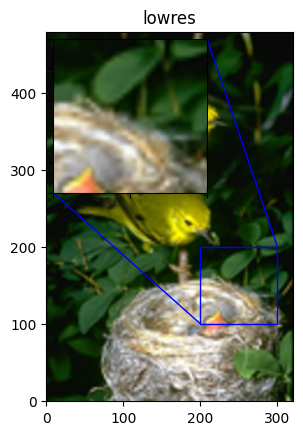

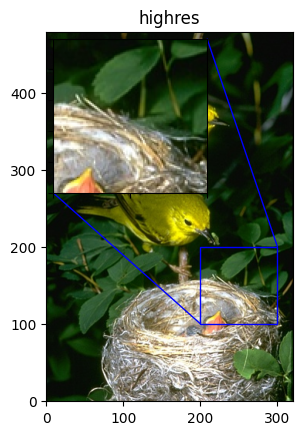

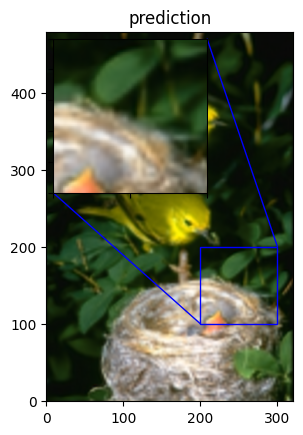

Avg. PSNR of lowres images is 26.7357
Avg. PSNR of reconstructions is 26.0557


In [50]:
total_bicubic_psnr = 0.0
total_test_psnr = 0.0

for index, test_img_path in enumerate(test_img_paths[50:60]):
    img = load_img(test_img_path)
    lowres_input = get_lowres_image(img, upscale_factor)
    w = lowres_input.size[0] * upscale_factor
    h = lowres_input.size[1] * upscale_factor
    highres_img = img.resize((w, h))
    lowres_img = lowres_input.resize((w, h))
    prediction = upscale_image(model, lowres_img)
    lowres_img_arr = img_to_array(lowres_img)
    highres_img_arr = img_to_array(highres_img)
    predict_img_arr = img_to_array(prediction)
    bicubic_psnr = tf.image.psnr(lowres_img_arr, highres_img_arr, max_val=255)
    # print(lowres_input.shape)
    # print(predict_img_arr.shape)
    # print(highres_img_arr.shape)
    print(np.max(predict_img_arr), np.min(predict_img_arr))
    test_psnr = tf.image.psnr(predict_img_arr, highres_img_arr, max_val=255)

    total_bicubic_psnr += bicubic_psnr
    total_test_psnr += test_psnr

    print(
        "PSNR of low resolution image and high resolution image is %.4f" % bicubic_psnr
    )
    print("PSNR of predict and high resolution is %.4f" % test_psnr)
    plot_results(lowres_img, index, "lowres")
    plot_results(highres_img, index, "highres")
    plot_results(prediction, index, "prediction")

print("Avg. PSNR of lowres images is %.4f" % (total_bicubic_psnr / 10))
print("Avg. PSNR of reconstructions is %.4f" % (total_test_psnr / 10))